In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
import rasterio

In [2]:
shape_file_path = r"C:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution\data\shapefiles\2020_SEPIM.shp"
csv_observations_path = r"C:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution\yellowness_dataset\observations_inventory.csv"
gdf = gpd.read_file(shape_file_path)
df = pd.read_csv(csv_observations_path)

# df.loc[:, ["yellowness","id_plot","observation_date"]].head()
gdf.columns


Index(['ID_PARCEL', 'SURF_PARC', 'CODE_CULTU', 'CODE_GROUP', 'CULTURE_D1',
       'CULTURE_D2', 'REGION', 'PARCEL_ID', 'REGION_ext', 'num_inters',
       'id_plot', '26_05', '02_06', '03_06', '04_06', '08_06', '09_06',
       '11_06', '12_06', '15_06', '16_06', '17_06', '18_06', '19_06', '22_06',
       '23_06', '24_06', '26_06', '29_06', '30_06', '01_07', '02_07', '03_07',
       '06_07', '07_07', '08_07', '10_07', '13_07', '15_07', '16_07', '20_07',
       '21_07', '27_07', '28_07', '29_07', '31_07', '03_08', '04_08', '05_08',
       '06_08', '10_08', '11_08', '12_08', '13_08', '14_08', '17_08', '18_08',
       '24_08', '25_08', '26_08', '28_08', '31_08', '01_09', '02_09', '03_09',
       '04_09', '06_09', '07_09', '08_09', '09_09', '10_09', '11_09', '14_09',
       '15_09', '16_09', '17_09', '18_09', '22_09', '28_09', '29_09', '30_09',
       '09_10', '15_10', '21_10', '22_10', '26_10', '28_10', '29_10', '09_11',
       '16_11', '17_11', '18_11', 'geometry'],
      dtype='str')

In [78]:
gdf.head()
row = gdf[gdf["ID_PARCEL"] == "8094233"]
print(row)

    ID_PARCEL  SURF_PARC CODE_CULTU CODE_GROUP  CULTURE_D1  CULTURE_D2 REGION  \
188   8094233      14.08        BTN         24         NaN         NaN    IdF   

     PARCEL_ID REGION_ext  num_inters  ...  21_10 22_10 26_10 28_10 29_10  \
188      55097        IdF           1  ...    NaN   NaN   NaN   NaN   NaN   

    09_11 16_11 17_11 18_11                                           geometry  
188   NaN   NaN   NaN   NaN  POLYGON ((706752.691 6873295.215, 706647.647 6...  

[1 rows x 93 columns]


In [3]:
import geopandas as gpd
import pandas as pd

# Lecture du shapefile
gdf = gpd.read_file(shape_file_path)

# Colonnes correspondant aux dates
date_cols = [c for c in gdf.columns if c[:2].isdigit()]

# Nombre d'observations par parcelle
gdf["nb_observations"] = gdf[date_cols].notna().sum(axis=1)

# Parcelles ayant au moins une observation
parcelles_valides = gdf[gdf["nb_observations"] > 0]

# Statistiques générales
stats = {
    "Nombre total de parcelles": len(gdf),
    "Parcelles avec au moins une observation": len(parcelles_valides),
    "Parcelles sans observation": (gdf["nb_observations"] == 0).sum(),
    "Nombre total d'observations": gdf["nb_observations"].sum(),
}

print("=== Statistiques générales ===")
for k, v in stats.items():
    print(f"{k}: {v}")

=== Statistiques générales ===
Nombre total de parcelles: 218
Parcelles avec au moins une observation: 218
Parcelles sans observation: 0
Nombre total d'observations: 656


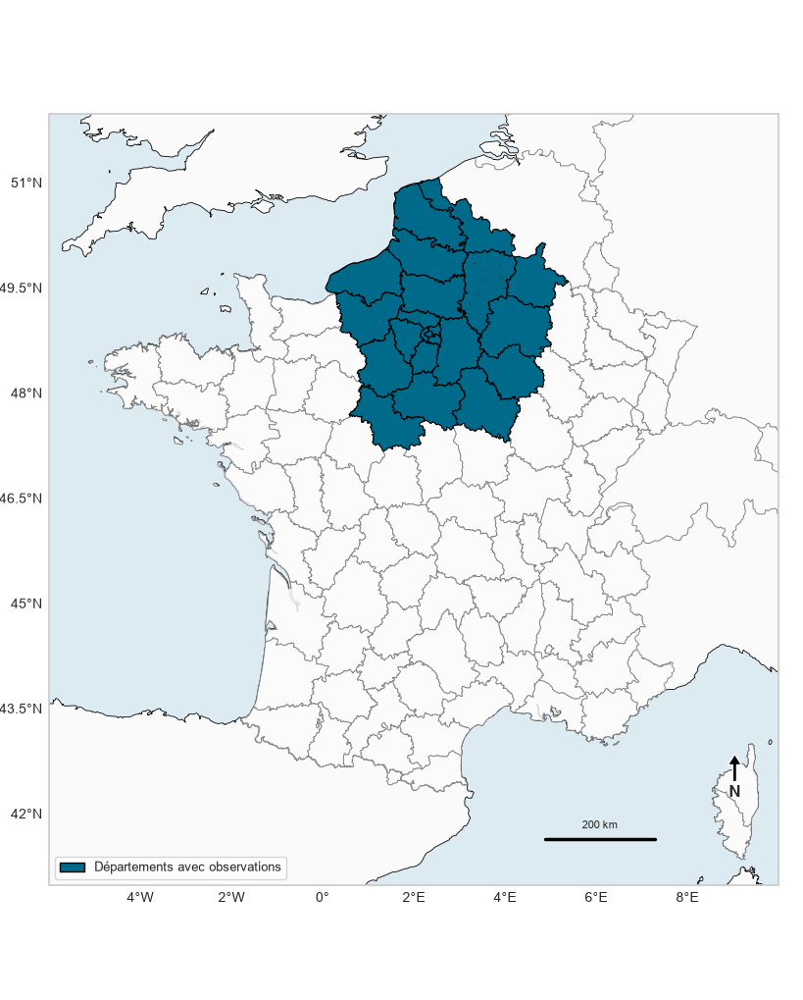

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.patches as mpatches
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# ------------------------------------------------------------------
# 1. Load data
# ------------------------------------------------------------------
observations = gpd.read_file(
    r"C:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution\data\shapefiles\2020_SEPIM.shp"
)

departements = gpd.read_file(
    r"C:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution\data\France_Contours_Departements\Departements.shp"
)

# ------------------------------------------------------------------
# 2. Projection (WGS84)
# ------------------------------------------------------------------
observations = observations.to_crs(epsg=4326)
departements = departements.to_crs(epsg=4326)

# ------------------------------------------------------------------
# 3. Keep only departments containing observations
# ------------------------------------------------------------------
obs_dep = gpd.sjoin(
    departements,
    observations[["geometry"]],
    how="inner",
    predicate="intersects"
)

departements_obs = departements.loc[obs_dep.index.unique()].copy()
# Add all Île-de-France departments from the full departments GeoDataFrame
idf_departements = departements[
    departements["DREG_L_LIB"].isin(["Île-de-France", "Ile-de-France"])
].copy()

# Append and remove duplicates (by department code)
departements_obs = gpd.GeoDataFrame(
    pd.concat([departements_obs, idf_departements], ignore_index=True),
    crs=departements_obs.crs
).drop_duplicates(subset="DDEP_C_COD")
# ------------------------------------------------------------------
# 4. Figure
# ------------------------------------------------------------------
fig = plt.figure(figsize=(8,10))
ax = plt.axes(projection=ccrs.PlateCarree())

ax.set_extent([-6, 10, 41, 52], crs=ccrs.PlateCarree())

ax.add_feature(cfeature.OCEAN.with_scale("10m"),
               facecolor="#DCEAF2", zorder=0)

ax.add_feature(cfeature.LAND.with_scale("10m"),
               facecolor="#FAFAFA", zorder=0)

ax.add_feature(cfeature.COASTLINE.with_scale("10m"),
               linewidth=0.6, zorder=1)

ax.add_feature(cfeature.BORDERS.with_scale("10m"),
               linewidth=0.7, edgecolor="gray", zorder=1)

# ------------------------------------------------------------------
# 5. Plot departments
# ------------------------------------------------------------------
departements_obs.plot(
    ax=ax,
    color="#006A8A",
    edgecolor="black",
    linewidth=0.8,
    transform=ccrs.PlateCarree(),
    zorder=2
)
# Plot unselected departments with grey borders
departements_unselected = departements[
    ~departements["DDEP_C_COD"].isin(departements_obs["DDEP_C_COD"])
].copy()

departements_unselected.plot(
    ax=ax,
    facecolor="#FCFCFCD8",
    edgecolor="grey",
    linewidth=0.6,
    transform=ccrs.PlateCarree(),
    zorder=1.8
)
# ------------------------------------------------------------------
# 6. Plot observation parcels
# ------------------------------------------------------------------


# ------------------------------------------------------------------
# 7. Grid
# ------------------------------------------------------------------
grid = ax.gridlines(draw_labels=True,
                    linewidth=0,
                    x_inline=False,
                    y_inline=False)

grid.top_labels = False
grid.right_labels = False
grid.xlabel_style = {"size":10}
grid.ylabel_style = {"size":10}

# ------------------------------------------------------------------
# 8. Title
# ------------------------------------------------------------------
ax.set_title(
    "Départements contenant des parcelles d'observation",
    fontsize=16,
    fontweight="bold",
    pad=20
)

# ------------------------------------------------------------------
# 9. Legend
# ------------------------------------------------------------------
legend_elements = [
    mpatches.Patch(
        facecolor="#006A8A",
        edgecolor="black",
        label="Départements avec observations"
    ),
]

ax.legend(handles=legend_elements,
          loc="lower left",
          frameon=True,
          fontsize=9)

# ------------------------------------------------------------------
# 10. Scale bar
# ------------------------------------------------------------------
def add_scale_bar(ax, length_km=200, location=(0.68,0.06)):
    import cartopy.geodesic as cgeo

    x0, x1, y0, y1 = ax.get_extent(ccrs.PlateCarree())

    geod = cgeo.Geodesic()

    lon0 = x0 + location[0] * (x1 - x0)
    lat0 = y0 + location[1] * (y1 - y0)

    pts = geod.direct([lon0, lat0], 90, length_km * 1000)
    lon1 = pts[0,0]

    ax.plot([lon0, lon1], [lat0, lat0],
            transform=ccrs.PlateCarree(),
            color="black",
            linewidth=2.5,
            zorder=5)

    ax.text((lon0+lon1)/2,
            lat0+0.15,
            f"{length_km} km",
            transform=ccrs.PlateCarree(),
            ha="center",
            fontsize=8)

add_scale_bar(ax)

# ------------------------------------------------------------------
# 11. North arrow
# ------------------------------------------------------------------
def add_north_arrow(ax, x=0.94, y=0.12, size=0.05):
    ax.annotate(
        "N",
        xy=(x, y+size),
        xytext=(x, y),
        xycoords="axes fraction",
        arrowprops=dict(facecolor="black",
                        width=3,
                        headwidth=10,
                        headlength=8),
        ha="center",
        va="center",
        fontsize=12,
        fontweight="bold"
    )

add_north_arrow(ax)
fig.subplots_adjust(left=0.05, right=0.98, bottom=0, top=1)
# ------------------------------------------------------------------
# 12. Save
# ------------------------------------------------------------------
plt.savefig(
    "France_departements_observations.png",
    dpi=600,
    bbox_inches="tight",
    pad_inches=0
)

plt.show()

In [25]:
import rasterio
from rasterio.windows import Window
from rasterio.transform import from_bounds
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from shapely.geometry import box

TIFF_FILE_PATH = r"C:\Users\ahtrabelsi\Desktop\stage\S2 data\Sentinel2_T31UEQ_TSG.tif"
OBS_PATH = r"C:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution\data\shapefiles\2020_SEPIM.shp"

# ---------------------------------------------------------
# Open Sentinel-2 raster
# ---------------------------------------------------------
src = rasterio.open(TIFF_FILE_PATH)

# ---------------------------------------------------------
# Load parcels and project to raster CRS
# ---------------------------------------------------------
gdf = gpd.read_file(OBS_PATH)
gdf = gdf.to_crs(src.crs)

# Keep only parcels inside the tile
tile = box(*src.bounds)
gdf = gdf[gdf.intersects(tile)].reset_index(drop=True)

print(f"Parcels inside tile : {len(gdf)}")

# ---------------------------------------------------------
# Select parcel
# ---------------------------------------------------------
parcel = gdf.iloc[5]
geom = parcel.geometry

# ---------------------------------------------------------
# Convert parcel bounds to pixel coordinates
# ---------------------------------------------------------
xmin, ymin, xmax, ymax = geom.bounds

row_min, col_min = src.index(xmin, ymax)
row_max, col_max = src.index(xmax, ymin)

# Ensure ordering
row_min, row_max = sorted((row_min, row_max))
col_min, col_max = sorted((col_min, col_max))

# ---------------------------------------------------------
# Build square patch centered on parcel
# ---------------------------------------------------------
parcel_w = col_max - col_min
parcel_h = row_max - row_min

patch_size = int(max(parcel_w, parcel_h) * 3)
patch_size = max(patch_size, 128)

center_row = (row_min + row_max) // 2
center_col = (col_min + col_max) // 2

row0 = center_row - patch_size // 2
col0 = center_col - patch_size // 2

# Keep inside raster
row0 = max(0, min(row0, src.height - patch_size))
col0 = max(0, min(col0, src.width - patch_size))

window = Window(
    col_off=col0,
    row_off=row0,
    width=patch_size,
    height=patch_size
)

# ---------------------------------------------------------
# Read RGB
# ---------------------------------------------------------
rgb = src.read([1, 2, 3], window=window).astype(np.float32)



Parcels inside tile : 60


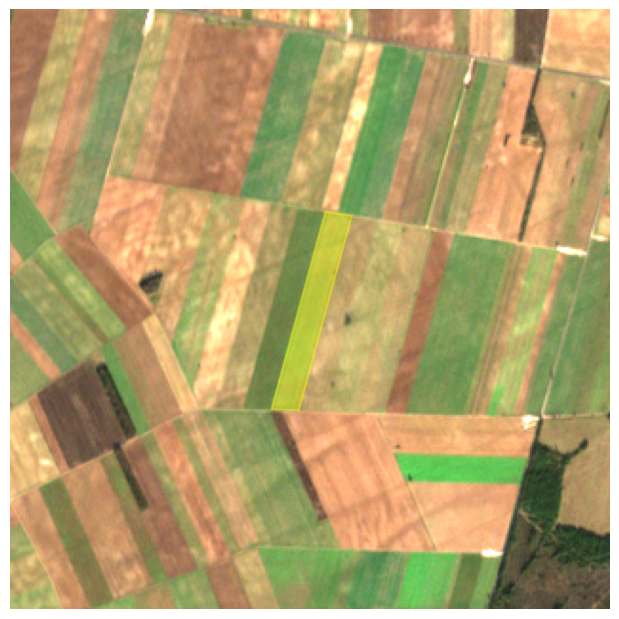

In [26]:
# ---------------------------------------------------------
# Reflectance preprocessing
# ---------------------------------------------------------
rgb /= 10000.0
rgb = np.clip(rgb, 0, 1)

# CHW -> HWC
rgb = np.moveaxis(rgb, 0, -1)

# If bands are stored as Blue, Green, Red, convert to RGB
rgb = rgb[:, :, [2, 1, 0]]

# Contrast stretch
stretch = np.percentile(rgb, 98)
rgb = np.clip(rgb / stretch, 0, 1)

# ---------------------------------------------------------
# Local transform of patch
# ---------------------------------------------------------
patch_transform = src.window_transform(window)


# ---------------------------------------------------------
# Convert polygon to local pixel coordinates
# ---------------------------------------------------------
def polygon_to_pixels(geometry, transform):
    inv = ~transform

    polygons = []

    if geometry.geom_type == "Polygon":
        geometries = [geometry]
    elif geometry.geom_type == "MultiPolygon":
        geometries = list(geometry.geoms)
    else:
        return polygons

    for poly in geometries:
        x, y = poly.exterior.xy
        coords = [inv * (xx, yy) for xx, yy in zip(x, y)]
        polygons.append(coords)

    return polygons

# ---------------------------------------------------------
# Plot
# ---------------------------------------------------------
fig, ax = plt.subplots(figsize=(6, 6))

ax.imshow(rgb)

for coords in polygon_to_pixels(geom, patch_transform):
    cols, rows = zip(*coords)
    ax.fill(
        cols,
        rows,
        facecolor="yellow",
        edgecolor="yellow",
        linewidth=1.5,
        alpha=0.35
    )

ax.set_axis_off()

plt.subplots_adjust(left=0, right=1, top=1, bottom=0)

plt.savefig(
    "sentinel2_reference_parcel.png",
    dpi=600,
    bbox_inches="tight",
    pad_inches=0
)

plt.show()

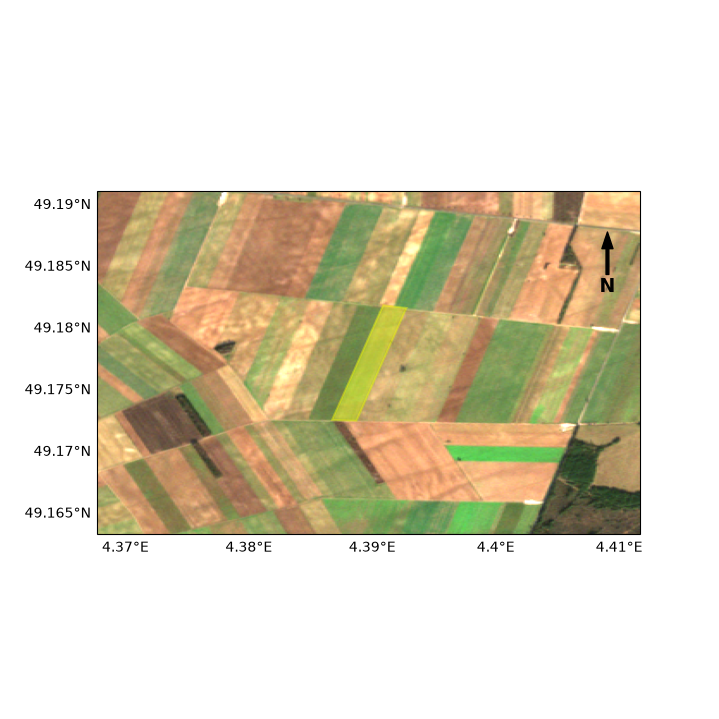

In [27]:
import cartopy.crs as ccrs
from pyproj import Transformer
from matplotlib.patches import Polygon

# ---------------------------------------------------------
# Compute geographic extent of the patch
# ---------------------------------------------------------
left, top = patch_transform * (0, 0)
right, bottom = patch_transform * (window.width, window.height)

transformer = Transformer.from_crs(src.crs, "EPSG:4326", always_xy=True)

lon_min, lat_min = transformer.transform(left, bottom)
lon_max, lat_max = transformer.transform(right, top)

# ---------------------------------------------------------
# Convert parcel coordinates to lon/lat
# ---------------------------------------------------------
def polygon_to_lonlat(geometry):
    polys = []

    if geometry.geom_type == "Polygon":
        geometries = [geometry]
    else:
        geometries = geometry.geoms

    for poly in geometries:
        x, y = poly.exterior.xy
        lon, lat = transformer.transform(x, y)
        polys.append(np.column_stack([lon, lat]))

    return polys

# ---------------------------------------------------------
# Plot
# ---------------------------------------------------------
fig = plt.figure(figsize=(7,7))

ax = plt.axes(projection=ccrs.PlateCarree())

ax.imshow(
    rgb,
    origin="upper",
    extent=[lon_min, lon_max, lat_min, lat_max],
    transform=ccrs.PlateCarree()
)

for poly in polygon_to_lonlat(geom):
    ax.add_patch(
        Polygon(
            poly,
            closed=True,
            facecolor="yellow",
            edgecolor="yellow",
            alpha=0.35,
            linewidth=1.5,
            transform=ccrs.PlateCarree()
        )
    )

# Latitude / longitude grid
gl = ax.gridlines(
    draw_labels=True,
    linewidth=0,
    linestyle="--",
    color="gray",
    alpha=0.6
)

gl.top_labels = False
gl.right_labels = False

# North arrow
ax.annotate(
    'N',
    xy=(0.94, 0.88),
    xytext=(0.94, 0.72),
    xycoords='axes fraction',
    textcoords='axes fraction',
    ha='center',
    va='center',
    fontsize=14,
    fontweight='bold',
    arrowprops=dict(facecolor='black', width=2, headwidth=8)
)

plt.savefig(
    "sentinel2_reference_parcel_map.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

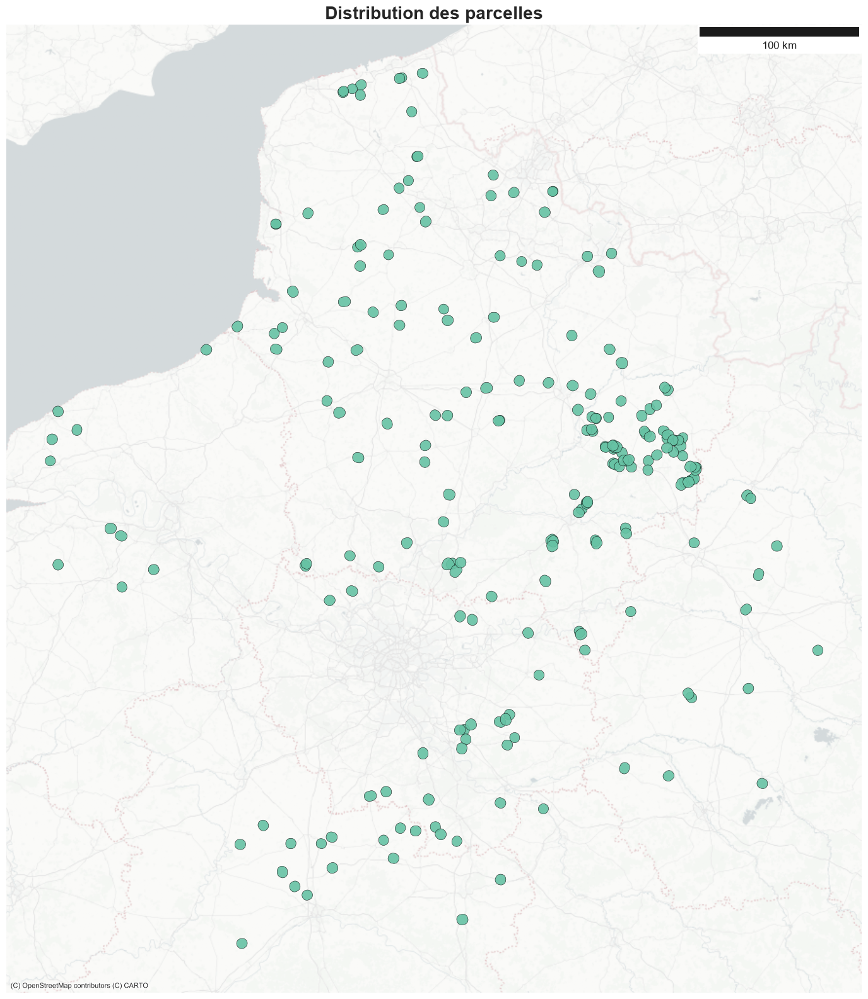

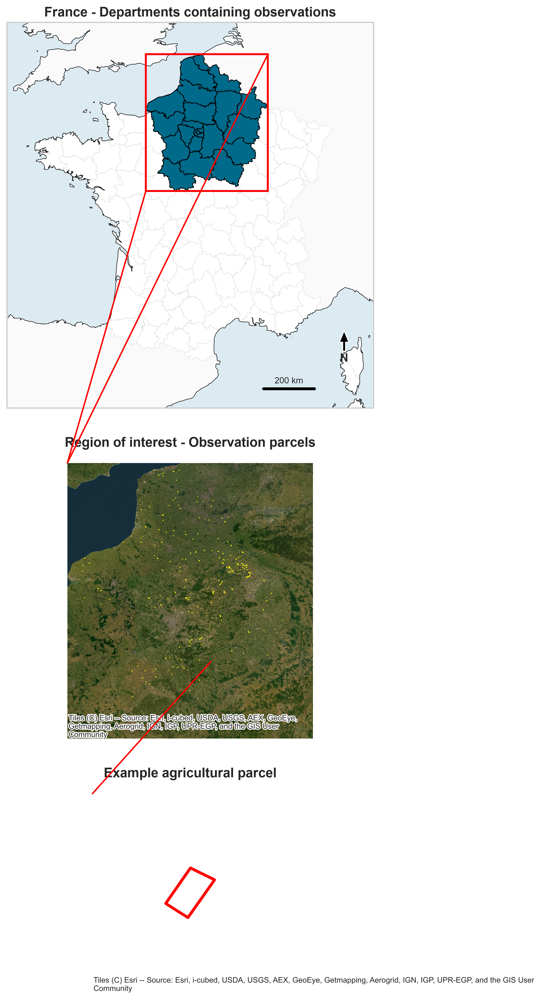

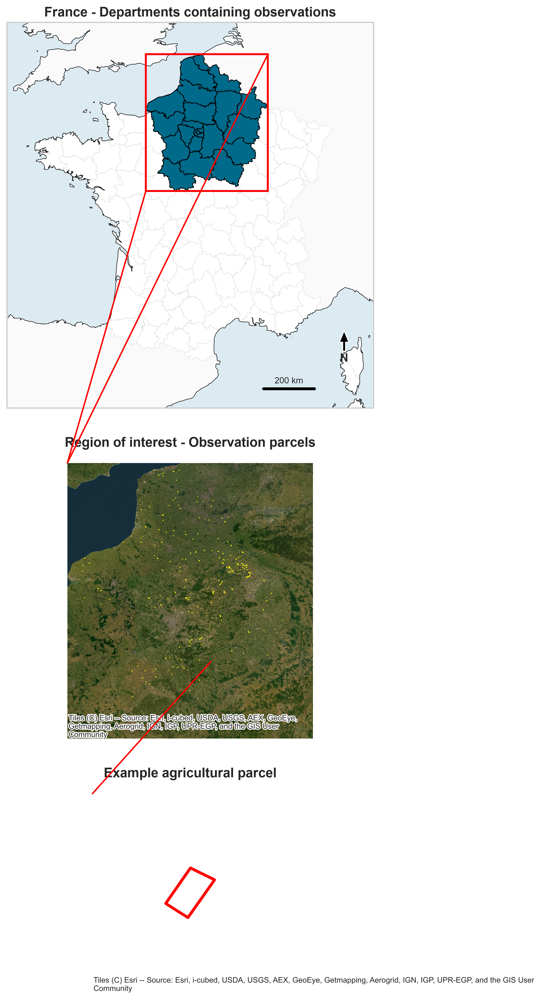

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib_scalebar.scalebar import ScaleBar

# Projection Web Mercator
gdf_web = gdf.to_crs(epsg=3857).copy()

# Agrandissement visuel des parcelles (en mètres)
gdf_web["geometry"] = gdf_web.buffer(3000)   # Essayer 10, 15, 20 ou 30

fig, ax = plt.subplots(figsize=(16, 16))

gdf_web.plot(
    ax=ax,
    facecolor="#66c2a4",
    edgecolor="black",
    linewidth=0.4,
    alpha=0.9
)

ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.PositronNoLabels
)

ax.add_artist(ScaleBar(1))

ax.set_title(
    "Distribution des parcelles",
    fontsize=20,
    fontweight="bold"
)

ax.set_axis_off()

plt.tight_layout()

plt.savefig(
    "distribution_parcelles.png",
    dpi=500,
    bbox_inches="tight"
)

plt.show()

In [4]:
# CELL 3 — setup, validation, normalization
from pathlib import Path
import os
import seaborn as sns
from IPython.display import display

sns.set(style="whitegrid", context="notebook")

ROOT = Path(r"C:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution")

# Expected columns from your message
required_df_cols = [
    "year","parcel_area_m2","parcel_area_ha","month","day_of_year",
    "s2_date_difference_days","id_plot","observation_date",
    "s2_acquisition_date","day_offset","yellowness",
    "lr_patch","sr_patch","lr_mask","sr_mask"
]
missing = [c for c in required_df_cols if c not in df.columns]
print("Missing required columns:", missing if missing else "None")

# Harmonize types
for c in ["observation_date", "s2_acquisition_date"]:
    if c in df.columns:
        df[c] = pd.to_datetime(df[c], errors="coerce")

for c in ["year","month","day_of_year","day_offset","s2_date_difference_days","yellowness","parcel_area_m2","parcel_area_ha"]:
    if c in df.columns:
        df[c] = pd.to_numeric(df[c], errors="coerce")

# Resolve tif paths
def resolve_path(p):
    if pd.isna(p):
        return np.nan
    p = str(p).strip().replace("/", os.sep)
    pp = Path(p)
    if pp.is_absolute():
        return str(pp)
    return str((ROOT / pp).resolve())

for c in ["lr_patch","sr_patch","lr_mask","sr_mask"]:
    if c in df.columns:
        df[c] = df[c].apply(resolve_path)

# Basic checks
print("Rows:", len(df))
print("Unique parcels in df:", df["id_plot"].nunique() if "id_plot" in df.columns else "N/A")
print("Unique parcels in shp:", gdf["id_plot"].nunique() if "id_plot" in gdf.columns else "N/A")
display(df.head(3))
display(gdf[["id_plot","ID_PARCEL","PARCEL_ID","SURF_PARC"]].head(3) if set(["id_plot","ID_PARCEL","PARCEL_ID","SURF_PARC"]).intersection(gdf.columns) else gdf.head(3))

Missing required columns: None
Rows: 425
Unique parcels in df: 128
Unique parcels in shp: 218


,year,parcel_area_m2,parcel_area_ha,month,day_of_year,s2_date_difference_days,id_plot,observation_date,s2_acquisition_date,day_offset,...,sr_RE_slope_705_740_mean,sr_RE_slope_705_740_std,sr_RE_slope_740_783_mean,sr_RE_slope_740_783_std,sr_RE_slope_783_865_mean,sr_RE_slope_783_865_std,sr_RE_curvature_705_740_783_mean,sr_RE_curvature_705_740_783_std,sr_RE_curvature_740_783_865_mean,sr_RE_curvature_740_783_865_std
0,2020,19.86,0.001986,6,161,1,16575797,2020-06-08,2020-06-09,1,...,0.003483,0.001338,0.000679,0.000282,0.000262,0.000054,-0.092695,0.036289,-0.007747,0.010649
1,2020,19.86,0.001986,6,166,1,16575797,2020-06-15,2020-06-14,1,...,0.003805,0.001238,0.000730,0.000268,0.000274,0.000056,-0.101804,0.033181,-0.008894,0.010325
2,2020,19.86,0.001986,6,176,2,16575797,2020-06-22,2020-06-24,2,...,0.004450,0.001154,0.000828,0.000280,0.000299,0.000069,-0.120138,0.029412,-0.011088,0.011440


,id_plot,ID_PARCEL,PARCEL_ID,SURF_PARC
0,952451,9278603,985,3.85
1,898805,17048383,4232,12.77
2,895322,17048804,4243,3.70


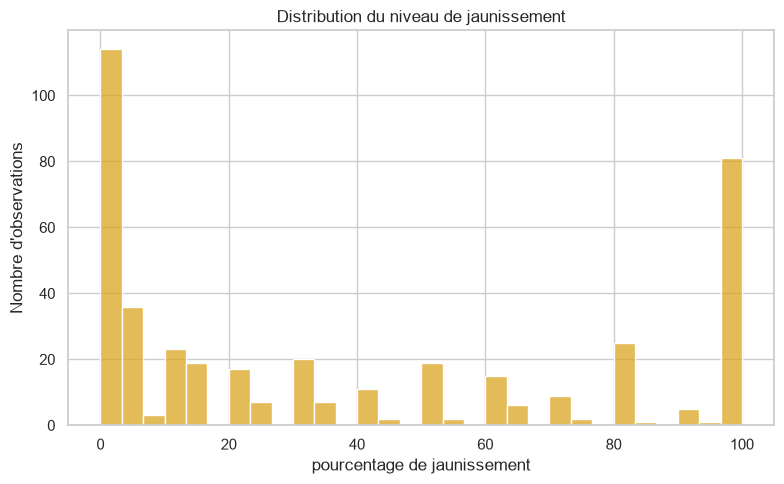

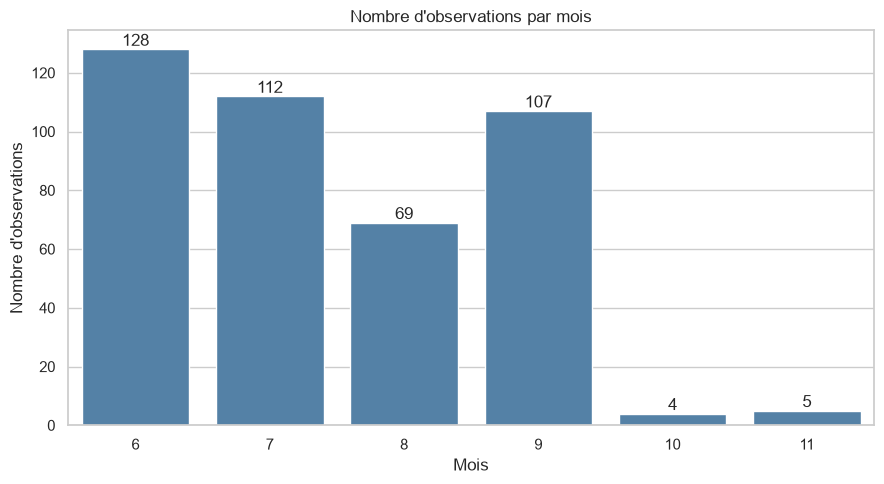

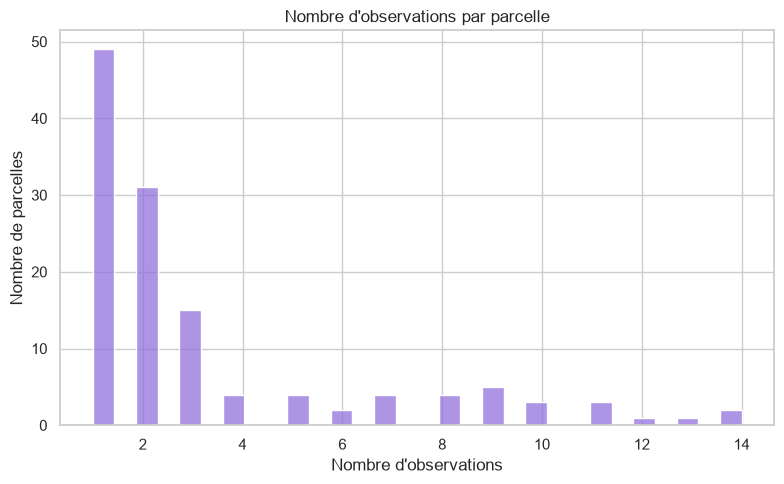

In [63]:
import os
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

save_dir = "eda_plots_fr"
os.makedirs(save_dir, exist_ok=True)

# -----------------------------
# 1. Distribution du jaunissement
# -----------------------------
plt.figure(figsize=(8, 5))

sns.histplot(
    df["yellowness"].dropna(),
    bins=30,
    color="goldenrod"
)

plt.title("Distribution du niveau de jaunissement")
plt.xlabel("pourcentage de jaunissement")
plt.ylabel("Nombre d'observations")

plt.tight_layout()
plt.savefig(
    os.path.join(save_dir, "distribution_jaunissement.png"),
    dpi=300,
    bbox_inches="tight"
)
plt.show()


# -----------------------------
# 3. Nombre d'observations par mois
# -----------------------------
if "month" in df.columns:

    observations_mois = (
        df["month"]
        .value_counts()
        .sort_index()
        .rename_axis("mois")
        .reset_index(name="nombre_observations")
    )

    plt.figure(figsize=(9, 5))

    sns.barplot(
        data=observations_mois,
        x="mois",
        y="nombre_observations",
        color="steelblue"
    )

    plt.title("Nombre d'observations par mois")
    plt.xlabel("Mois")
    plt.ylabel("Nombre d'observations")

    for i, v in enumerate(observations_mois["nombre_observations"]):
        plt.text(i, v, str(v), ha="center", va="bottom")

    plt.tight_layout()

    plt.savefig(
        os.path.join(save_dir, "observations_par_mois.png"),
        dpi=300,
        bbox_inches="tight"
    )

    plt.show()



# -----------------------------
# 5. Nombre d'observations par parcelle
# -----------------------------
observations_parcelle = (
    df.groupby("id_plot")
    .size()
    .rename("nombre_observations")
    .reset_index()
)

plt.figure(figsize=(8, 5))

sns.histplot(
    observations_parcelle["nombre_observations"],
    bins=30,
    color="mediumpurple"
)

plt.title("Nombre d'observations par parcelle")
plt.xlabel("Nombre d'observations")
plt.ylabel("Nombre de parcelles")

plt.tight_layout()

plt.savefig(
    os.path.join(save_dir, "observations_par_parcelle.png"),
    dpi=300,
    bbox_inches="tight"
)

plt.show()

In [5]:
# CELL 6 — spectral utilities (LR/SR + masks + indices)
import rasterio

# Adjust if your band order differs
# Common S2 stack examples:
# [B2, B3, B4, B8, B11, B12]
BAND_MAP = {"B2": 1, "B3": 2, "B4": 3, "B8": 4, "B11": 5, "B12": 6}

def read_stack(path):
    with rasterio.open(path) as src:
        arr = src.read().astype("float32")  # (bands, h, w)
        desc = src.descriptions
    return arr, desc

def read_mask(path):
    with rasterio.open(path) as src:
        m = src.read(1)
    return m

def safe_div(a, b):
    out = np.full_like(a, np.nan, dtype="float32")
    np.divide(a, b, out=out, where=(b != 0))
    return out

def compute_indices(arr, band_map):
    idx = {}
    g = lambda b: arr[band_map[b]-1]

    if all(k in band_map for k in ["B8","B4"]):
        nir, red = g("B8"), g("B4")
        idx["NDVI"] = safe_div(nir - red, nir + red)
        L = 0.5
        idx["SAVI"] = safe_div((nir - red) * (1 + L), nir + red + L)

    if all(k in band_map for k in ["B8","B3"]):
        nir, green = g("B8"), g("B3")
        idx["GNDVI"] = safe_div(nir - green, nir + green)

    if all(k in band_map for k in ["B8","B11"]):
        nir, swir = g("B8"), g("B11")
        idx["NDMI"] = safe_div(nir - swir, nir + swir)

    if all(k in band_map for k in ["B8","B4","B2"]):
        nir, red, blue = g("B8"), g("B4"), g("B2")
        idx["EVI"] = 2.5 * safe_div((nir - red), (nir + 6*red - 7.5*blue + 1))

    return idx

def apply_binary_mask(img2d, mask2d):
    out = img2d.copy()
    out[mask2d == 0] = np.nan
    return out

def robust_limits(a, p1=2, p2=98):
    v = a[np.isfinite(a)]
    if v.size == 0:
        return -1, 1
    return np.percentile(v, [p1, p2])

def heterogeneity_metrics(x):
    v = x[np.isfinite(x)]
    if v.size == 0:
        return dict(mean=np.nan, std=np.nan, cv=np.nan, iqr=np.nan)
    q1, q3 = np.percentile(v, [25, 75])
    mean = np.mean(v)
    std = np.std(v)
    return dict(mean=mean, std=std, cv=(std/mean if mean != 0 else np.nan), iqr=(q3-q1))

In [8]:
# CELL 7 — restart: -10m inner buffer + LR/SR RGB + zoomed index maps + LRvsSR distributions
import os
from pathlib import Path
import seaborn as sns
from rasterio.features import rasterize
from shapely.geometry import mapping

# -----------------------------
# 1) Choose one valid observation
# -----------------------------
from pathlib import Path
import re
import os

DATASET_ROOT = Path(r"C:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution\yellowness_dataset")
csv_observations_path = r"C:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution\yellowness_dataset\observations_inventory.csv"

path_cols = ["lr_patch", "sr_patch", "lr_mask", "sr_mask"]
anchor_dirs = {"images_lr", "images_sr", "masks_lr", "masks_sr"}

# Reload raw CSV to avoid already-modified wrong absolute paths in df
df_raw = pd.read_csv(csv_observations_path)

def _unwrap_markdown_link(s: str) -> str:
    # handles strings like: [C:\...\file.tif](file:///...)
    m = re.match(r"^\[(.*)\]\(file:///.*\)$", s)
    return m.group(1) if m else s

def resolve_from_dataset_root(p):
    if pd.isna(p):
        return np.nan

    s = str(p).strip().strip('"').strip("'")
    s = _unwrap_markdown_link(s)
    s = s.replace("/", os.sep).replace("\\", os.sep)
    pp = Path(s)

    # If absolute and exists, keep it
    if pp.is_absolute() and pp.exists():
        return str(pp)

    parts = list(pp.parts)

    # If path contains one of anchor dirs, rebuild from there under DATASET_ROOT
    idx = None
    for i, part in enumerate(parts):
        if part in anchor_dirs:
            idx = i
            break

    if idx is not None:
        rel = Path(*parts[idx:])           # images_lr\xxx.tif, etc.
        return str((DATASET_ROOT / rel).resolve())

    # Otherwise treat as plain relative to dataset root
    return str((DATASET_ROOT / pp).resolve())

valid = df_raw.dropna(subset=["id_plot", *path_cols]).copy()
for c in path_cols:
    valid[c] = valid[c].apply(resolve_from_dataset_root)

# diagnostics
missing = []
for _, r in valid.iterrows():
    for c in path_cols:
        if not os.path.isfile(r[c]):
            missing.append((c, r[c]))

if missing:
    print(f"{len(missing)} missing files (showing first 20):")
    for c, p in missing[:20]:
        print(f"{c}: {p}")

valid = valid[valid.apply(lambda r: all(os.path.isfile(r[c]) for c in path_cols), axis=1)]
if valid.empty:
    raise RuntimeError("No valid LR/SR patch+mask files found from DATASET_ROOT.")

print("Valid rows:", len(valid))
print("Example LR:", valid['lr_patch'].iloc[0])

parcel_rank = valid.groupby("id_plot")["yellowness"].std().sort_values(ascending=False)
target_parcel = parcel_rank.index[0] if len(parcel_rank) else valid["id_plot"].iloc[0]
row = (valid[valid["id_plot"] == target_parcel]
       .sort_values("observation_date")
       .iloc[0])

print("LR :", row["lr_patch"])
print("SR :", row["sr_patch"])
print("LM :", row["lr_mask"])
print("SM :", row["sr_mask"])
# -----------------------------
# 2) read stacks, masks, transforms
# -----------------------------
def read_stack_with_meta(path):
    with rasterio.open(path) as src:
        arr = src.read().astype("float32")
        transform = src.transform
        crs = src.crs
    return arr, transform, crs

def read_mask_with_meta(path):
    with rasterio.open(path) as src:
        m = src.read(1)
        transform = src.transform
        crs = src.crs
    return m, transform, crs

lr_arr, lr_tr, lr_crs = read_stack_with_meta(row["lr_patch"])
sr_arr, sr_tr, sr_crs = read_stack_with_meta(row["sr_patch"])
lr_m0, _, _ = read_mask_with_meta(row["lr_mask"])
sr_m0, _, _ = read_mask_with_meta(row["sr_mask"])

# -----------------------------
# 3) build -10m buffered parcel mask in raster space
# -----------------------------
if "id_plot" in gdf.columns:
    parcel_g = gdf[gdf["id_plot"] == target_parcel]
elif "ID_PARCEL" in gdf.columns:
    parcel_g = gdf[gdf["ID_PARCEL"] == target_parcel]
else:
    raise RuntimeError("No matching parcel key in shapefile (expected id_plot or ID_PARCEL).")

if parcel_g.empty:
    raise RuntimeError(f"Parcel {target_parcel} not found in shapefile.")

geom = parcel_g.geometry.iloc[0]

def inward_buffer_geom(geom, gdf_crs, dist_m=10):
    if gdf_crs is None:
        return geom
    # if CRS is geographic, buffer in metric CRS then convert back
    if gdf_crs.is_geographic:
        tmp = gpd.GeoSeries([geom], crs=gdf_crs).to_crs(3857)
        buf = tmp.buffer(-dist_m).iloc[0]
        if buf.is_empty:
            return geom
        return gpd.GeoSeries([buf], crs=3857).to_crs(gdf_crs).iloc[0]
    else:
        buf = geom.buffer(-dist_m)
        return geom if buf.is_empty else buf

geom_buf = inward_buffer_geom(geom, gdf.crs, dist_m=10)

def rasterized_mask_from_geom(geom_in_gdf_crs, gdf_crs, dst_crs, dst_transform, dst_shape):
    gs = gpd.GeoSeries([geom_in_gdf_crs], crs=gdf_crs)
    gs = gs.to_crs(dst_crs) if (gdf_crs is not None and dst_crs is not None) else gs
    m = rasterize(
        [(mapping(gs.iloc[0]), 1)],
        out_shape=dst_shape,
        transform=dst_transform,
        fill=0,
        dtype="uint8"
    )
    return m

lr_geom_mask = rasterized_mask_from_geom(geom_buf, gdf.crs, lr_crs, lr_tr, lr_m0.shape)
sr_geom_mask = rasterized_mask_from_geom(geom_buf, gdf.crs, sr_crs, sr_tr, sr_m0.shape)

# combine dataset mask + buffered geometry mask
lr_m = ((lr_m0 > 0) & (lr_geom_mask > 0)).astype("uint8")
sr_m = ((sr_m0 > 0) & (sr_geom_mask > 0)).astype("uint8")

# -----------------------------
# 4) RGB helper + zoom bbox from mask
# -----------------------------
def rgb_from_stack(arr, bm):
    if not all(k in bm for k in ["B4","B3","B2"]):
        return None
    rgb = np.stack([arr[bm["B4"]-1], arr[bm["B3"]-1], arr[bm["B2"]-1]], axis=-1)
    v = rgb[np.isfinite(rgb)]
    p2, p98 = np.percentile(v, [2,98]) if v.size else (0,1)
    return np.clip((rgb - p2)/(p98 - p2 + 1e-6), 0, 1)

def bbox_from_mask(m, pad_ratio=0.12, min_pad=8):
    ys, xs = np.where(m > 0)
    h, w = m.shape
    if xs.size == 0:
        return 0, w, 0, h
    x0, x1, y0, y1 = xs.min(), xs.max(), ys.min(), ys.max()
    px = max(min_pad, int((x1-x0+1)*pad_ratio))
    py = max(min_pad, int((y1-y0+1)*pad_ratio))
    x0, x1 = max(0, x0-px), min(w, x1+px+1)
    y0, y1 = max(0, y0-py), min(h, y1+py+1)
    return x0, x1, y0, y1

lr_rgb = rgb_from_stack(lr_arr, BAND_MAP)
sr_rgb = rgb_from_stack(sr_arr, BAND_MAP)

# -----------------------------
# 5) display LR vs SR RGB (highlight + zoom)
# -----------------------------
fig, ax = plt.subplots(2, 2, figsize=(14, 12))

if lr_rgb is not None:
    x0, x1, y0, y1 = bbox_from_mask(lr_m)
    ax[0,0].imshow(lr_rgb)
    ax[0,0].contour(lr_m, levels=[0.5], colors="cyan", linewidths=1.2)
    ax[0,0].plot([x0,x1,x1,x0,x0], [y0,y0,y1,y1,y0], color="yellow", lw=2)
    ax[0,0].set_title(f"LR RGB (buffered parcel -10m)")
    ax[0,0].axis("off")

    ax[1,0].imshow(lr_rgb[y0:y1, x0:x1])
    ax[1,0].contour(lr_m[y0:y1, x0:x1], levels=[0.5], colors="cyan", linewidths=1.2)
    ax[1,0].set_title("LR RGB zoom")
    ax[1,0].axis("off")
else:
    ax[0,0].text(0.5,0.5,"No RGB bands in BAND_MAP",ha="center")
    ax[1,0].axis("off")

if sr_rgb is not None:
    x0, x1, y0, y1 = bbox_from_mask(sr_m)
    ax[0,1].imshow(sr_rgb)
    ax[0,1].contour(sr_m, levels=[0.5], colors="cyan", linewidths=1.2)
    ax[0,1].plot([x0,x1,x1,x0,x0], [y0,y0,y1,y1,y0], color="yellow", lw=2)
    ax[0,1].set_title(f"SR RGB (buffered parcel -10m)")
    ax[0,1].axis("off")

    ax[1,1].imshow(sr_rgb[y0:y1, x0:x1])
    ax[1,1].contour(sr_m[y0:y1, x0:x1], levels=[0.5], colors="cyan", linewidths=1.2)
    ax[1,1].set_title("SR RGB zoom")
    ax[1,1].axis("off")
else:
    ax[0,1].text(0.5,0.5,"No RGB bands in BAND_MAP",ha="center")
    ax[1,1].axis("off")

plt.tight_layout()
plt.show()

# -----------------------------
# 6) compute indices + show zoomed maps LR vs SR
# -----------------------------
lr_idx = compute_indices(lr_arr, BAND_MAP)
sr_idx = compute_indices(sr_arr, BAND_MAP)
idx_names = [k for k in ["NDVI","GNDVI","NDMI","SAVI","EVI"] if k in lr_idx and k in sr_idx]
if not idx_names:
    raise RuntimeError("No common indices available. Check BAND_MAP.")

def masked(a, m):
    out = a.copy()
    out[m == 0] = np.nan
    return out

# use same bbox logic for maps
x0l, x1l, y0l, y1l = bbox_from_mask(lr_m)
x0s, x1s, y0s, y1s = bbox_from_mask(sr_m)

fig, axes = plt.subplots(len(idx_names), 2, figsize=(11, 4*len(idx_names)))
if len(idx_names) == 1:
    axes = np.array([axes])

for i, n in enumerate(idx_names):
    li = masked(lr_idx[n], lr_m)[y0l:y1l, x0l:x1l]
    si = masked(sr_idx[n], sr_m)[y0s:y1s, x0s:x1s]
    v = np.concatenate([li.ravel(), si.ravel()])
    v = v[np.isfinite(v)]
    vmin, vmax = (np.percentile(v, [2,98]) if v.size else (-1,1))

    im0 = axes[i,0].imshow(li, cmap="RdYlGn", vmin=vmin, vmax=vmax)
    axes[i,0].set_title(f"LR {n} (zoom)")
    axes[i,0].axis("off")
    plt.colorbar(im0, ax=axes[i,0], fraction=0.046, pad=0.04)

    im1 = axes[i,1].imshow(si, cmap="RdYlGn", vmin=vmin, vmax=vmax)
    axes[i,1].set_title(f"SR {n} (zoom)")
    axes[i,1].axis("off")
    plt.colorbar(im1, ax=axes[i,1], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

# -----------------------------
# 7) LR vs SR distributions inside parcel (buffered)
# -----------------------------
dist_rows = []
for n in idx_names:
    lv = masked(lr_idx[n], lr_m)
    sv = masked(sr_idx[n], sr_m)
    lv = lv[np.isfinite(lv)]
    sv = sv[np.isfinite(sv)]
    dist_rows += [{"index": n, "source": "LR", "value": x} for x in lv]
    dist_rows += [{"index": n, "source": "SR", "value": x} for x in sv]

dist_df = pd.DataFrame(dist_rows)

g = sns.FacetGrid(dist_df, col="index", col_wrap=3, height=3.2, sharex=False, sharey=False)
g.map_dataframe(sns.kdeplot, x="value", hue="source", common_norm=False, fill=True, alpha=0.25)
g.add_legend()
g.fig.suptitle("Index value distributions inside buffered parcel (-10m): LR vs SR", y=1.03)
plt.show()

plt.figure(figsize=(12, 4))
sns.boxplot(data=dist_df, x="index", y="value", hue="source")
plt.title("LR vs SR distribution comparison (boxplots)")
plt.tight_layout()
plt.show()

Valid rows: 425
Example LR: C:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution\yellowness_dataset\images_lr\lr_plot_16575797_obs_2020-06-08.tif
LR : C:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution\yellowness_dataset\images_lr\lr_plot_4772557_obs_2020-06-08.tif
SR : C:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution\yellowness_dataset\images_sr\sr_plot_4772557_obs_2020-06-08.tif
LM : C:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution\yellowness_dataset\masks_lr\mask_lr_plot_4772557_static.tif
SM : C:\Users\ahtrabelsi\Desktop\stage\s2-super-resolution\yellowness_dataset\masks_sr\mask_sr_plot_4772557_static.tif


C:\Users\ahtrabelsi\AppData\Local\Temp\ipykernel_6968\4059309418.py:103: DeprecationWarning: Setting the shape on a NumPy array has been deprecated in NumPy 2.5.
As an alternative, you can create a new view using np.reshape (with copy=False if needed).
  m = src.read(1)


RuntimeError: Parcel 4772557 not found in shapefile.